# House Price Prediction Case Study

#### Problem Statement:

Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. The company is looking at prospective properties to buy to enter the market.

The company wants to know:

- Which variables are significant in predicting the price of a house
- How well those variables describe the price of a house.

This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

# Step 1: Reading and Understanding the Data

Let us first import libraries which will be used.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model, metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import os

# hide warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
housing=pd.read_csv('train.csv')

In [3]:
housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
housing.shape

(1460, 81)

In [5]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

### Creating a derived column - "AgeHouse"
It is the age of the house calculated by YrSold-YearBuilt.

In [6]:
housing['AgeHouse'] = housing['YrSold'] - housing['YearBuilt']

### Removing few columns :-
- YrSold and YearBuilt columns. As we derived the age of the house, so we do not need these columns anymore in our analysis.
- YearRemodAdd, GarageYrBlt and MoSold columns - As these columns will not be such useful while doing our analysis.

In [7]:
# Removing columns
housing.drop(['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold', 'MoSold'], axis=1, inplace=True)


In [8]:
# Converting column type for categorical variable from numeric to object
housing['MSSubClass'] = housing['MSSubClass'].astype('object')
housing['OverallQual'] = housing['OverallQual'].astype('object')
housing['OverallCond'] = housing['OverallCond'].astype('object')

# Handaling missing values
## Replacing few NA values to relevant names
- We can see from the data dictonary that for few columns the NA value represents the not present of the feature in the house instead of representing the missing values. Hence, we need to impute the NA or the missing values for those columns to the relevant name.

In [9]:
housing['Alley'] = housing['Alley'].replace(np.nan, 'No Alley')
housing['BsmtQual'] = housing['BsmtQual'].replace(np.nan, 'No Basement')
housing['BsmtCond'] = housing['BsmtCond'].replace(np.nan, 'No Basement')
housing['BsmtExposure'] = housing['BsmtExposure'].replace(np.nan, 'No Basement')
housing['BsmtFinType1'] = housing['BsmtFinType1'].replace(np.nan, 'No Basement')
housing['BsmtFinType2'] = housing['BsmtFinType2'].replace(np.nan, 'No Basement')
housing['FireplaceQu'] = housing['FireplaceQu'].replace(np.nan, 'No Fireplace')
housing['GarageType'] = housing['GarageType'].replace(np.nan, 'No Garage')
housing['GarageFinish'] = housing['GarageFinish'].replace(np.nan, 'No Garage')
housing['GarageQual'] = housing['GarageQual'].replace(np.nan, 'No Garage')
housing['GarageCond'] = housing['GarageCond'].replace(np.nan, 'No Garage')
housing['PoolQC'] = housing['PoolQC'].replace(np.nan, 'No Pool')
housing['Fence'] = housing['Fence'].replace(np.nan, 'No Fence')
housing['MiscFeature'] = housing['MiscFeature'].replace(np.nan, 'No MiscFeature')

### Find and Drop columns with more than 50% null values

In [10]:
housing.columns[housing.isnull().sum()>housing.shape[0]*.5]

Index(['MasVnrType'], dtype='object')

In [11]:
housing.drop(['Id','MasVnrType'],axis=1,inplace=True)

### Check remaining columns which contain any null values

In [12]:
housing.columns[housing.isnull().sum()>0]

Index(['LotFrontage', 'MasVnrArea', 'Electrical'], dtype='object')

### Check  Null Row Count for all columns

In [13]:
housing[['LotFrontage', 'MasVnrArea', 'Electrical']].isnull().sum()

LotFrontage    259
MasVnrArea       8
Electrical       1
dtype: int64

### housing['MasVnrArea'] 
- There is huge difference between mean and median. std is also very high. Hence best is to remove the null value rows which are only 8.  

In [14]:
housing['MasVnrArea'].describe()

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64

In [18]:
housing=housing[housing['MasVnrArea'].notnull()]

In [19]:
# Mean and median are close hence we can impute safely
housing['LotFrontage']=housing['LotFrontage'].fillna(housing['LotFrontage'].mean())

In [20]:
# Impute missing value with the most occuring.
housing['Electrical']=housing['Electrical'].fillna(housing['Electrical'].mode()[0])


In [21]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1452 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1452 non-null   object 
 1   MSZoning       1452 non-null   object 
 2   LotFrontage    1452 non-null   float64
 3   LotArea        1452 non-null   int64  
 4   Street         1452 non-null   object 
 5   Alley          1452 non-null   object 
 6   LotShape       1452 non-null   object 
 7   LandContour    1452 non-null   object 
 8   Utilities      1452 non-null   object 
 9   LotConfig      1452 non-null   object 
 10  LandSlope      1452 non-null   object 
 11  Neighborhood   1452 non-null   object 
 12  Condition1     1452 non-null   object 
 13  Condition2     1452 non-null   object 
 14  BldgType       1452 non-null   object 
 15  HouseStyle     1452 non-null   object 
 16  OverallQual    1452 non-null   object 
 17  OverallCond    1452 non-null   object 
 18  RoofStyle    

In [22]:
housing.describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,AgeHouse
count,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,...,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000,1452.000000
mean,70.030126,10507.276171,103.685262,441.970386,46.805785,567.070937,1055.847107,1161.270661,346.944215,5.876722,...,472.475207,94.416667,46.390496,21.937328,3.428375,15.143939,2.774105,43.728650,180615.063361,36.699036
std,22.033477,9989.563592,181.066207,455.360279,161.726239,442.082927,438.119089,385.018424,436.370724,48.754995,...,214.106397,125.393706,66.048619,61.089879,29.396943,55.899665,40.287389,497.478278,79285.541485,30.242159
min,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000,0.000000
25%,60.000000,7538.750000,0.000000,0.000000,0.000000,222.500000,794.750000,882.000000,0.000000,0.000000,...,327.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,129900.000000,8.000000
50%,70.030126,9478.500000,0.000000,381.000000,0.000000,477.500000,990.500000,1086.000000,0.000000,0.000000,...,478.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,162700.000000,35.000000
75%,79.000000,11600.000000,166.000000,706.500000,0.000000,808.000000,1297.250000,1391.000000,728.000000,0.000000,...,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,214000.000000,54.250000
max,313.000000,215245.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,...,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,755000.000000,136.000000


# Step 2: EDA and Visualising Data

#### Visualising Numeric Variables

Let's make a heatmap of all the numeric continuous variables

In [23]:
numeric_cols = list(housing.select_dtypes(include=['int64', 'float64']).columns)

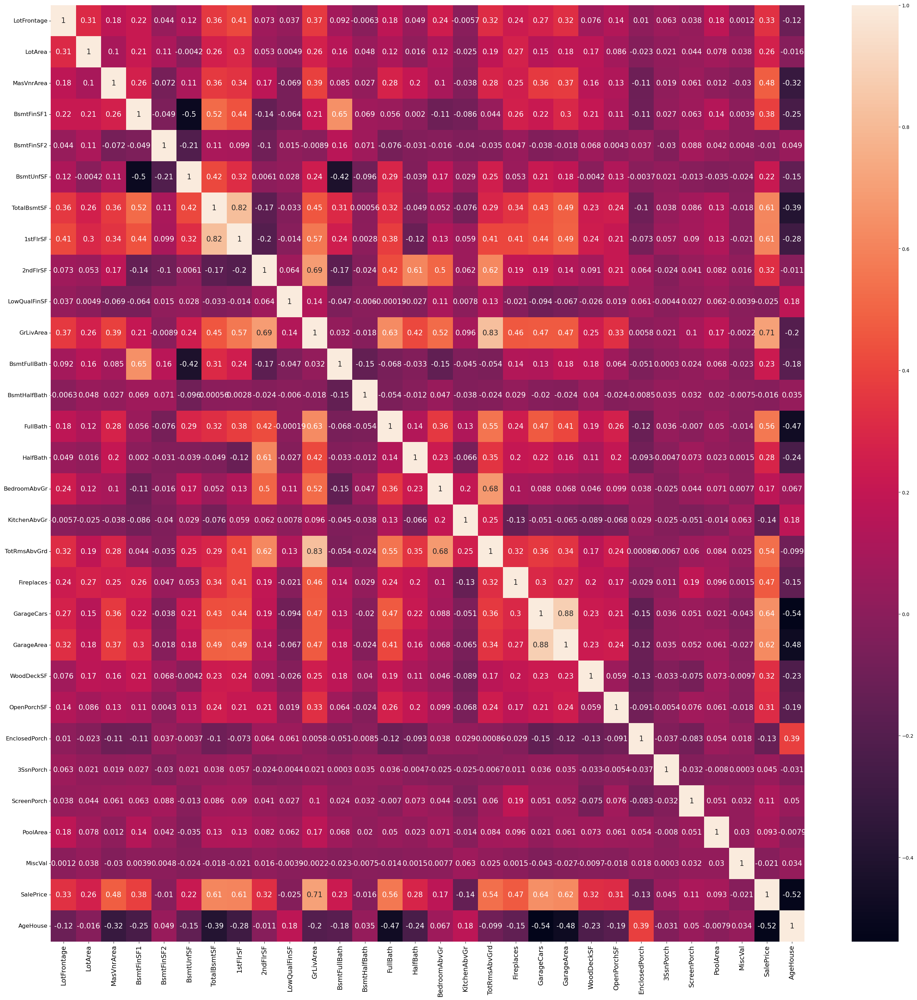

In [24]:
plt.figure(figsize = (35,35))
sns.heatmap(housing[numeric_cols].corr(),annot=True, annot_kws={"size": 15})
plt.xticks(fontsize=14)  # Set the font size of the column names
plt.yticks(fontsize=12)  # Set the font size of the row names
plt.show()

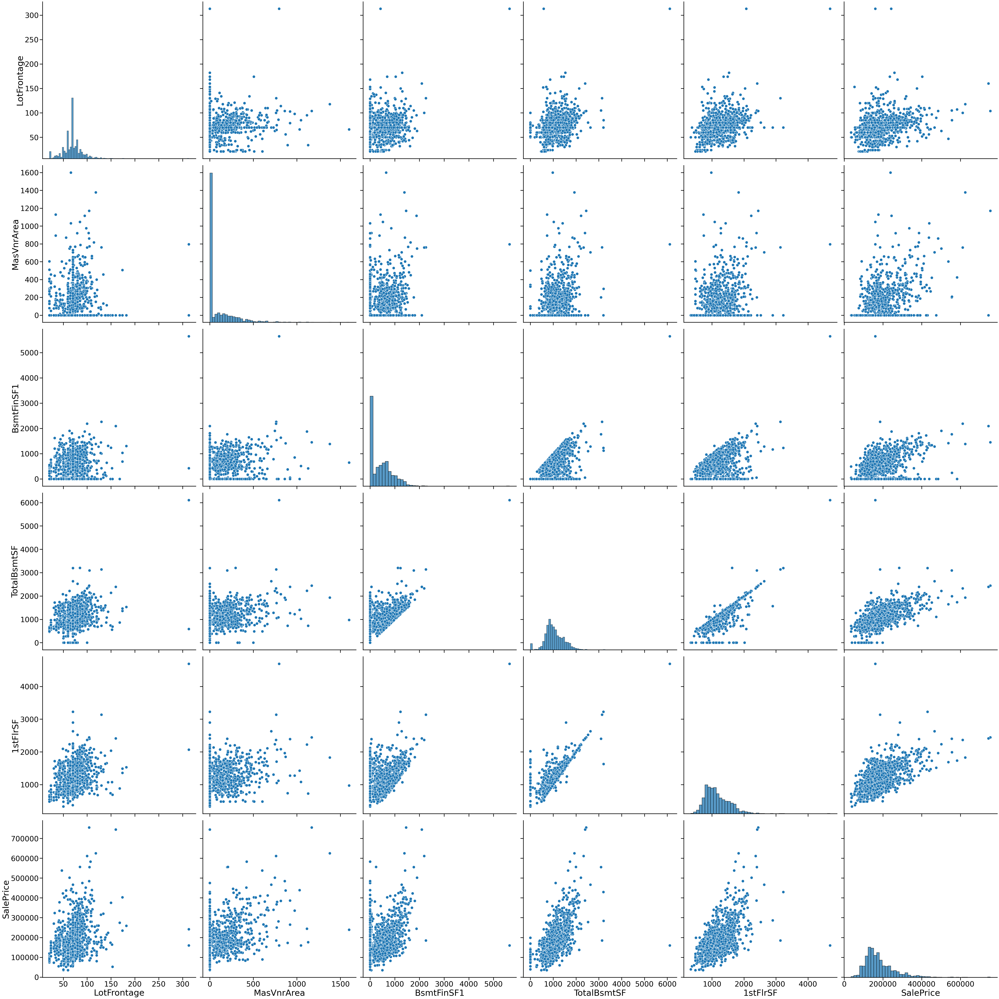

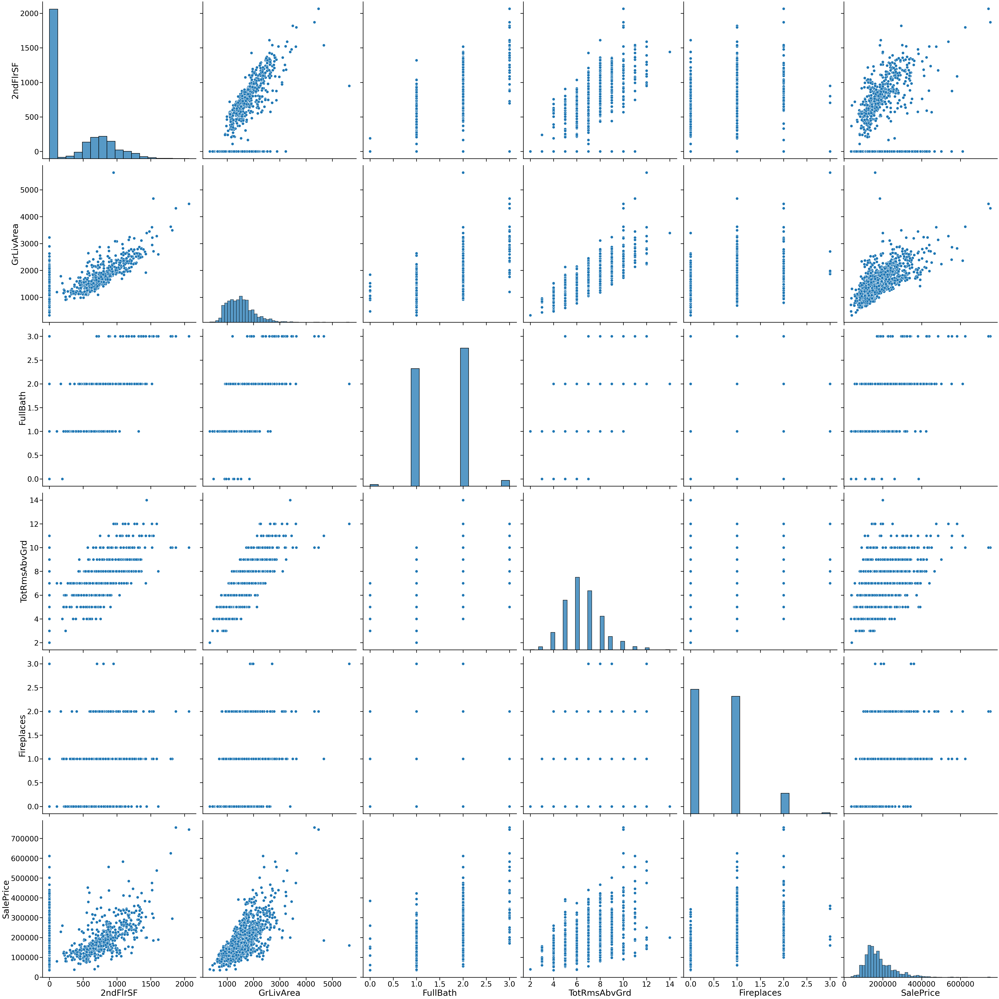

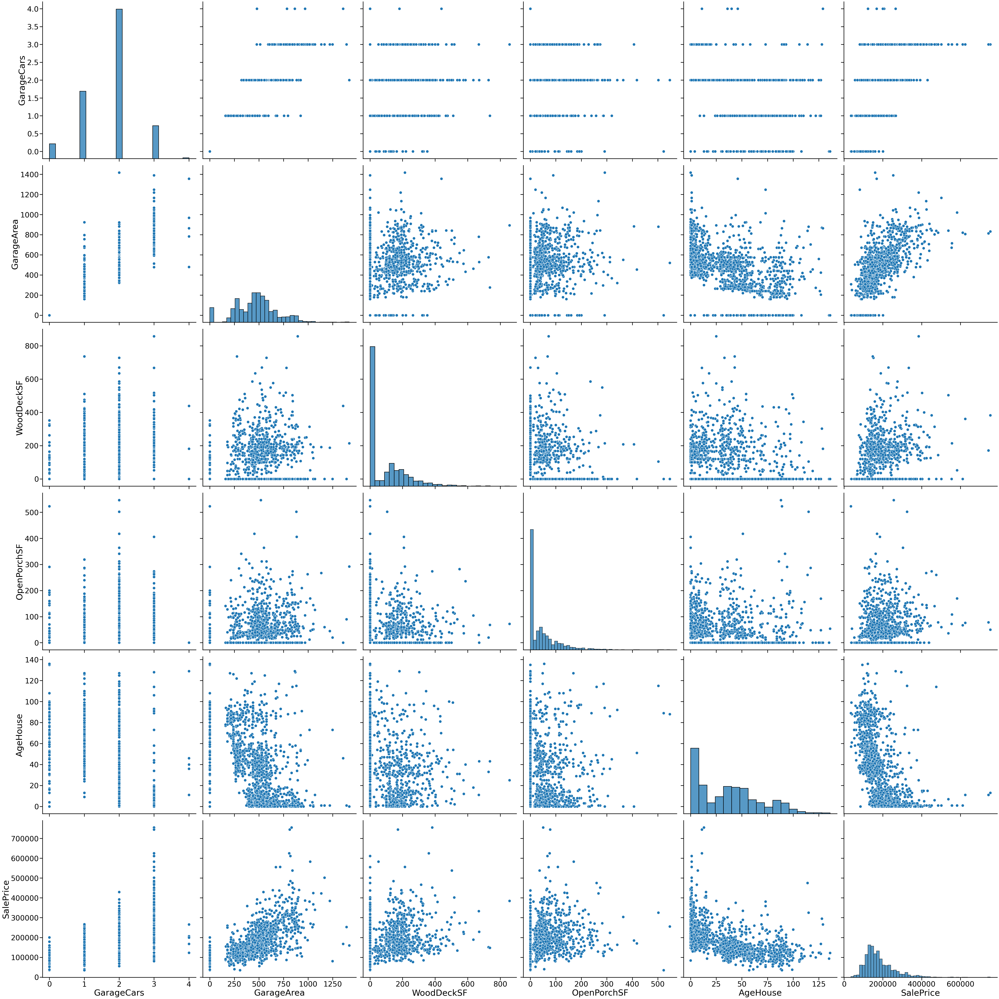

In [25]:
# Plot pairplot for only those variables which have high correlation to SalePrice from heatmap. 
#Creating 3 pairplots for different sets of variables all including SalePrice otherwise the graphs are too small to understand.

corr_var1 = ['LotFrontage','MasVnrArea','BsmtFinSF1','TotalBsmtSF','1stFlrSF','SalePrice']
corr_var2 = ['2ndFlrSF', 'GrLivArea','FullBath','TotRmsAbvGrd','Fireplaces','SalePrice']   
corr_var3 = ['GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','AgeHouse','SalePrice']

sns.set_context("poster", rc={"axes.labelsize":36}, font_scale=1.4)
sns.pairplot(housing[corr_var1], height=10)
plt.show()
sns.pairplot(housing[corr_var2], height=10)
plt.show()
sns.pairplot(housing[corr_var3], height=10)
plt.show()


In [26]:
category_cols = list(housing.select_dtypes(include=['object']).columns)


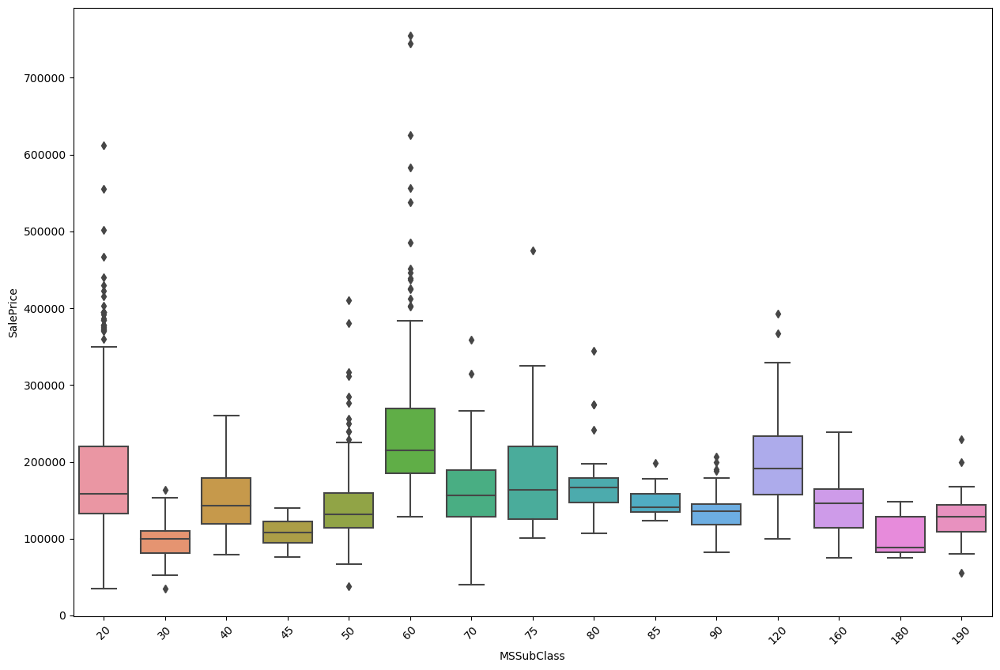

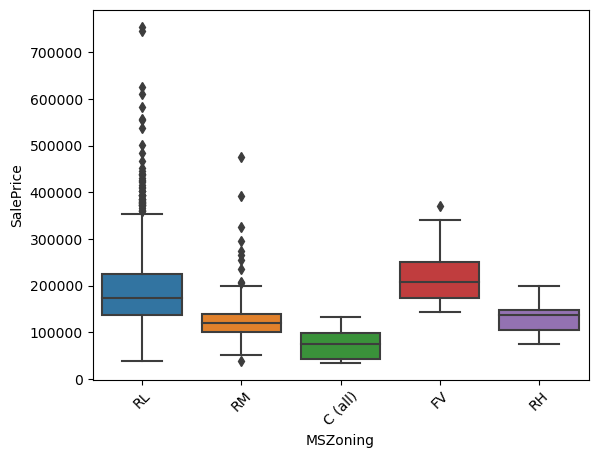

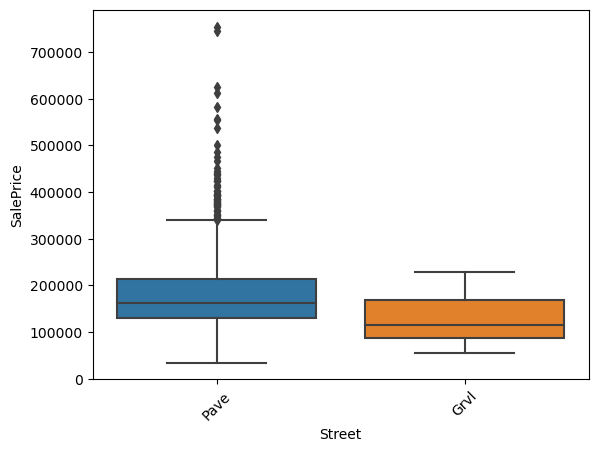

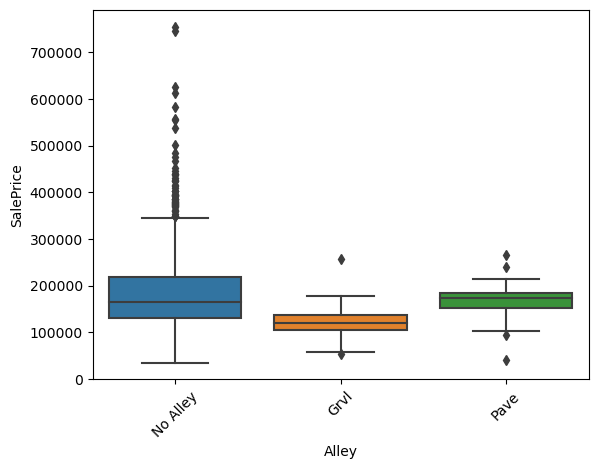

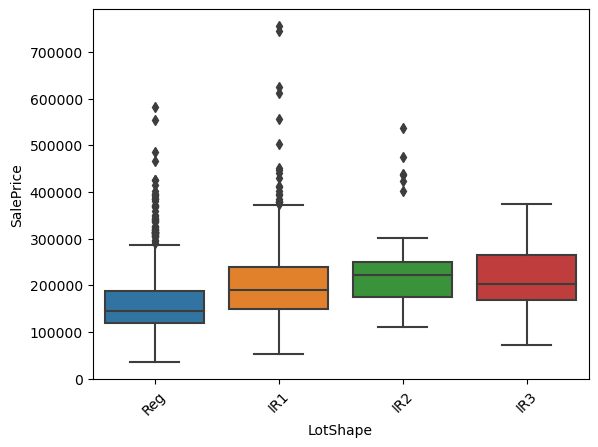

...

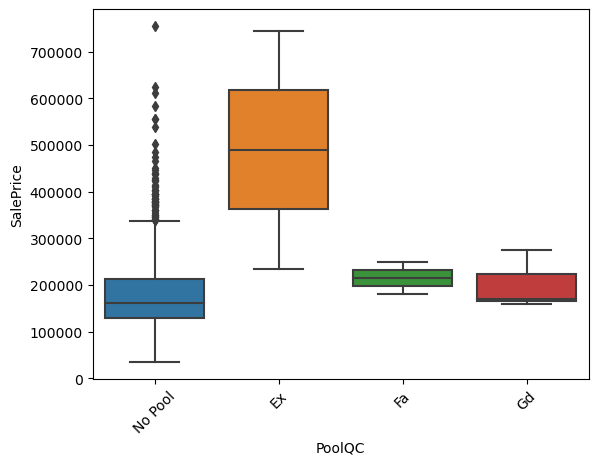

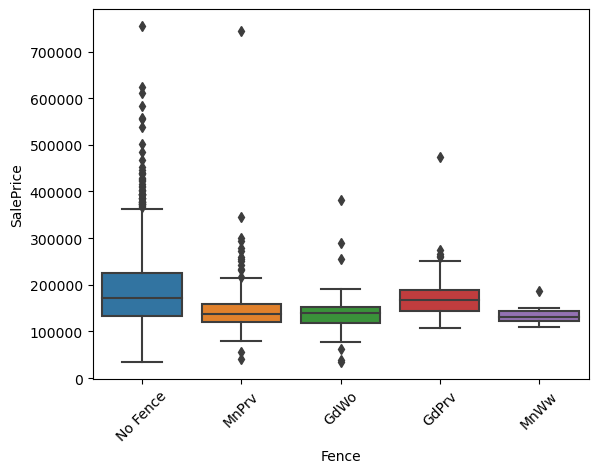

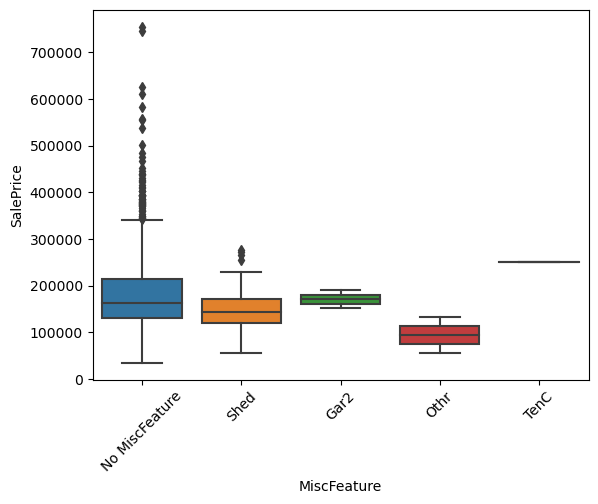

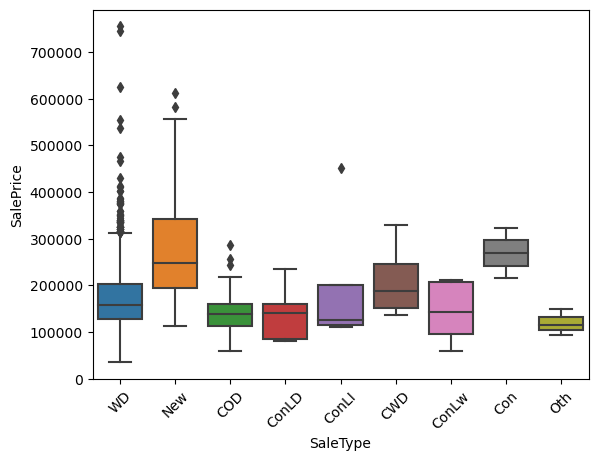

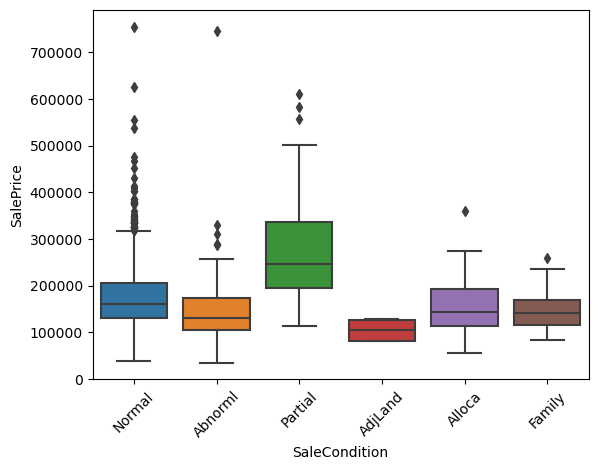

In [27]:
sns.reset_orig()
plt.figure(figsize=(15,10))

for idx,val in enumerate(category_cols):
    plt.xticks(rotation=45)
    sns.boxplot(x=val, y='SalePrice', data=housing)
    plt.show()

In [28]:
# Check the number of values under each category
for idx,val in enumerate(category_cols):
    print(housing[val].value_counts())

MSSubClass
20     532
60     296
50     144
120     86
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64
MSZoning
RL         1146
RM          218
FV           62
RH           16
C (all)      10
Name: count, dtype: int64
Street
Pave    1446
Grvl       6
Name: count, dtype: int64
Alley
No Alley    1362
Grvl          50
Pave          40
Name: count, dtype: int64
LotShape
Reg    919
IR1    482
IR2     41
IR3     10
Name: count, dtype: int64
LandContour
Lvl    1303
Bnk      63
HLS      50
Low      36
Name: count, dtype: int64
Utilities
AllPub    1451
NoSeWa       1
Name: count, dtype: int64
LotConfig
Inside     1046
Corner      262
CulDSac      93
FR2          47
FR3           4
Name: count, dtype: int64
LandSlope
Gtl    1374
Mod      65
Sev      13
Name: count, dtype: int64
Neighborhood
NAmes      225
CollgCr    149
OldTown    113
Edwards    100
Somerst     83
Gilbert     78
NridgHt     76
Sawy

## Ignore Features

- Most categorical variables have high number of rows under one category so we will not plot them as it will give wrong notion.
- Plot only those which have decent amount of data under each category

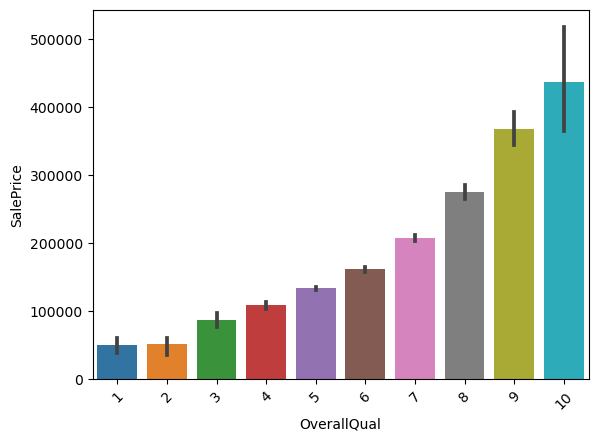

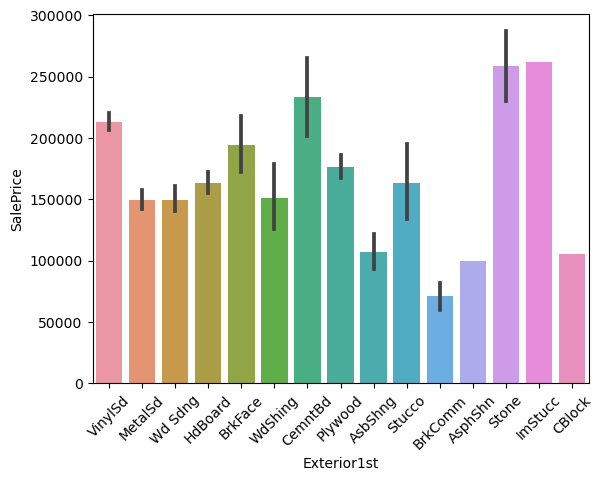

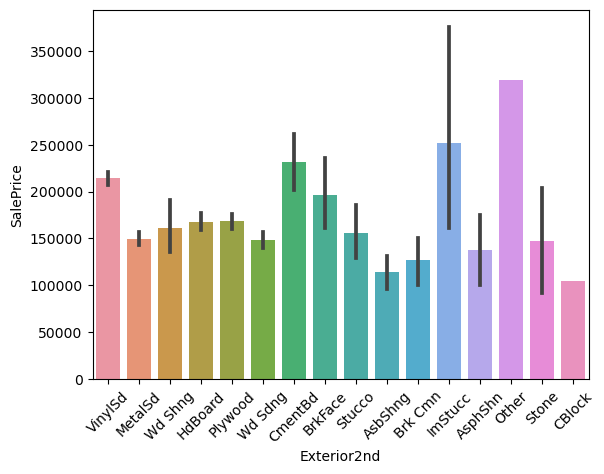

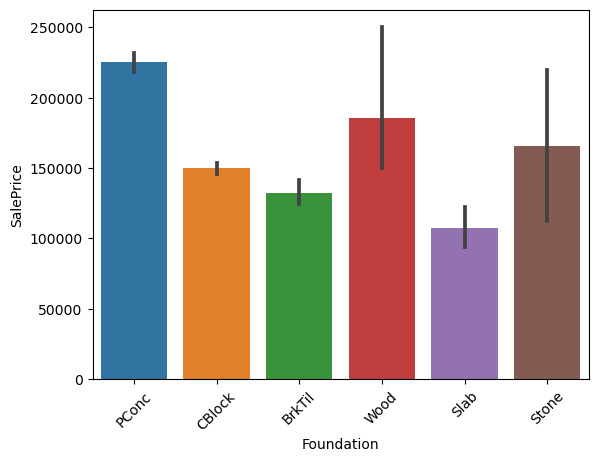

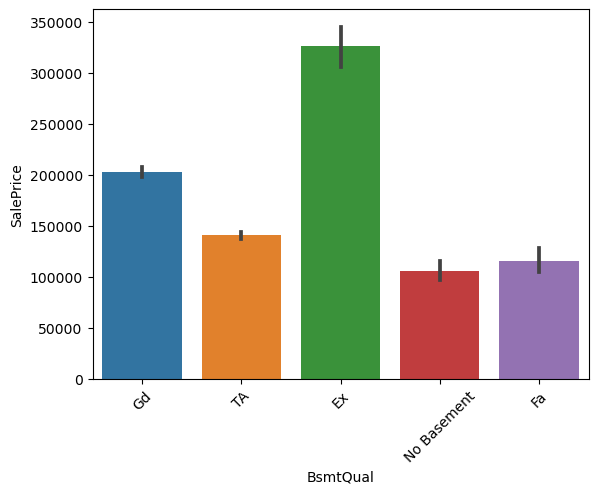

...

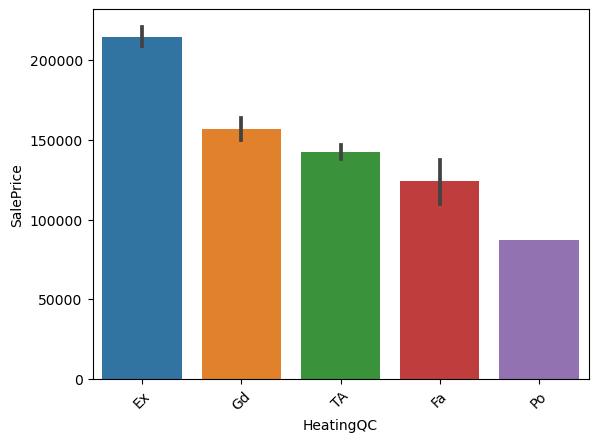

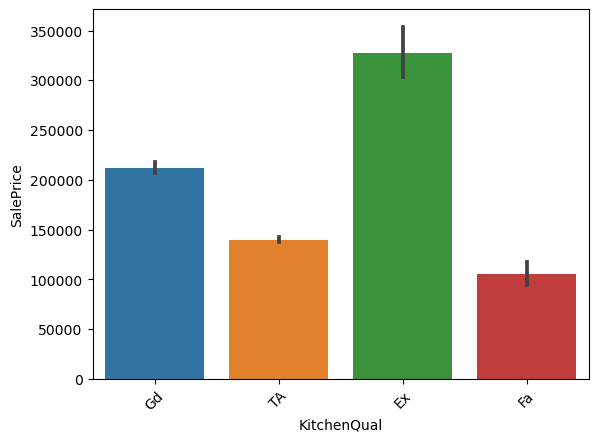

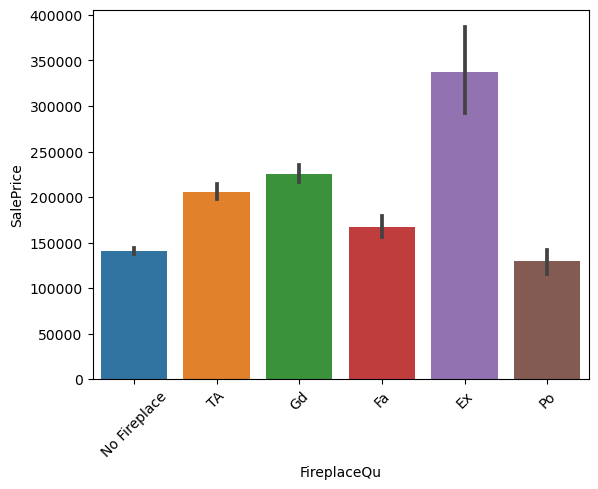

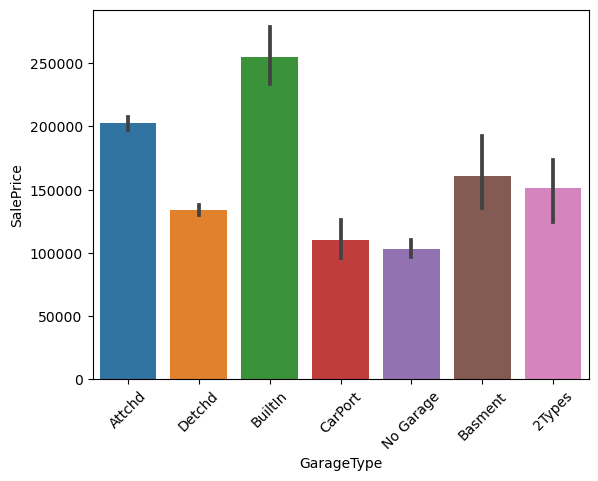

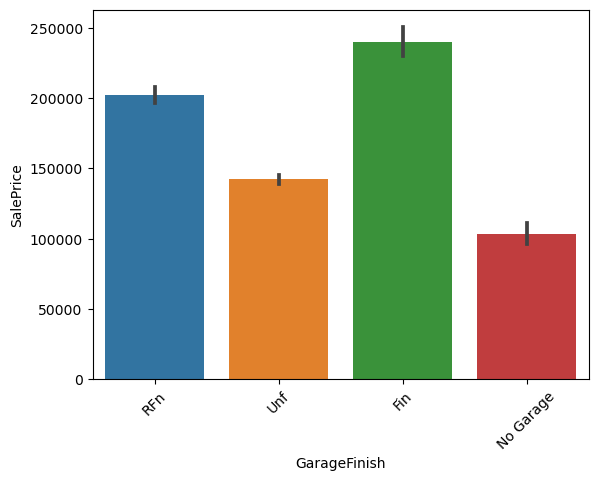

In [29]:
for idx,val in enumerate(['OverallQual', 'Exterior1st', 'Exterior2nd', 'Foundation', 'BsmtQual', 'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageFinish']):
    sns.barplot(housing,x=val,y='SalePrice')
    plt.xticks(rotation=45)
    plt.show()    

## Observations

1. Outliers are present but we would let the model algorithm handle.
2. SalePrice is positively correlated to GrLivArea, GarageCars, GarageSize, TotalBsmtSF, 1stFlrSF
3. SalePrice is negatively correlated to AgeHouse.
4. SalePrice is higher for better quality house, poured concrete foundation, excellent basement quality, heating quality, Kitchen quality, Fireplace quality and if Garage is BuiltIn.

## Step 3: Data Preparation (Train-test split, rescaling, etc)

### Dummy Variables

Create Dummy variables for categorical variables and drop first column so that there are level-1 columns. We need to convert these levels into integer as well. 

Merge the dummy variables with existing dataframe and drop the original categorical variables.

In [30]:
status=pd.get_dummies(housing[category_cols],drop_first=True,dtype=int)
df=pd.concat([housing,status],axis=1)
df.drop(category_cols,axis=1,inplace=True)

In [31]:
df_train,df_test=train_test_split(df,train_size=.7,random_state=100)

In [32]:
print(df_train.shape)
print(df_test.shape)

(1016, 281)
(436, 281)


## Feature Scaling

In [33]:
# Instantiate the scaler
scaler = MinMaxScaler()

In [34]:
# Scaling only the numeric variables. We don't need to scale the binary variables as they are already scaled into 0 and 1 and their dtype is int32
# Numeric columns list
num_vars = list(df_train.select_dtypes(include=['int64', 'float64']).columns)
# Fit the data into scaler and transform
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_train.head()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
25,0.304795,0.060436,0.40000,0.0,0.0,0.670377,0.488459,0.416487,0.000000,0.000000,...,0,0,0,0,1,0,0,0,1,0
88,0.287671,0.033513,0.00000,0.0,0.0,0.433647,0.315970,0.206093,0.000000,0.996117,...,0,0,0,0,0,0,0,0,0,0
986,0.130137,0.018743,0.00000,0.0,0.0,0.207620,0.151279,0.201792,0.307022,0.000000,...,0,0,0,0,1,0,0,0,1,0
1444,0.143836,0.033654,0.06625,0.0,0.0,0.608733,0.443543,0.352688,0.000000,0.000000,...,0,0,0,0,1,0,0,0,1,0
1108,0.167911,0.031611,0.00000,0.0,0.0,0.395548,0.288210,0.182796,0.359322,0.000000,...,0,0,0,0,1,0,0,0,0,0


In [35]:
y_train=df_train.pop('SalePrice')
X_train=df_train

In [36]:
lr = LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [37]:
y_train_pred=lr.predict(X_train)

# Step 4: Residual Analysis of the train data

So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like.

In [38]:
print(r2_score(y_train_pred,y_train))
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_train - y_train_pred))
print(rss)
mse = mean_squared_error(y_train, y_train_pred)
print(mse)
# Root Mean Squared Error
rmse = np.sqrt(mse)
print(rmse)

0.9477461585405226
0.6050854119007307
0.0005955565077763097
0.024404026466472897


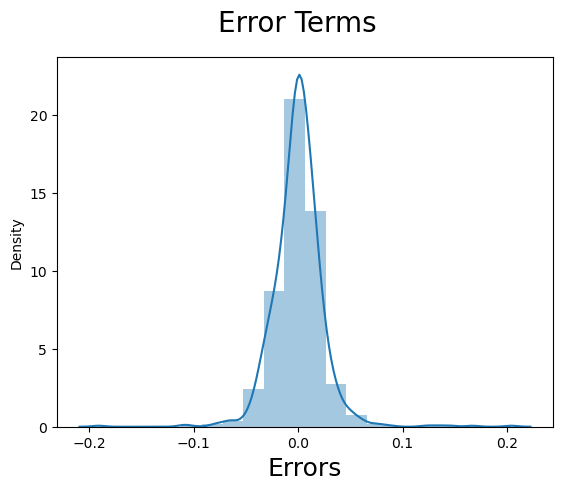

In [39]:
# Plot the histogram of the error terms which shows normal distribution
fig = plt.figure()
sns.distplot((y_train - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label
plt.show()

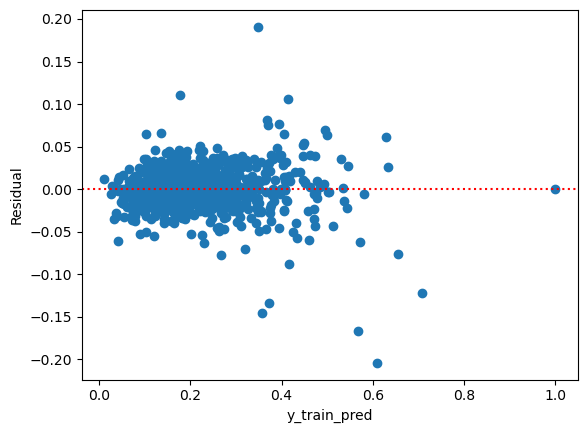

In [40]:
# Residual v/s predictions plot
res = y_train_pred-y_train
plt.scatter( y_train_pred , res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("y_train_pred")
plt.ylabel("Residual")
plt.show()

# Step 5: Making Predictions and Evaluation on test data
### Apply scaling on test set

In [41]:
df_test[num_vars] = scaler.transform(df_test[num_vars])
df_test.head()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
157,0.243151,0.050027,0.052500,0.000000,0.0,0.331336,0.241422,0.120430,0.578208,0.0,...,0,0,1,0,0,0,0,0,0,1
337,0.167808,0.036622,0.070625,0.358407,0.0,0.310788,0.479102,0.393548,0.000000,0.0,...,0,0,0,0,1,0,0,0,1,0
1120,0.130137,0.032546,0.000000,0.000000,0.0,0.433219,0.315658,0.205735,0.000000,0.0,...,0,0,0,0,1,0,0,0,1,0
563,0.154110,0.095726,0.000000,0.000000,0.0,0.497860,0.362757,0.259857,0.247458,0.0,...,0,0,0,0,1,0,0,0,1,0
371,0.202055,0.073944,0.000000,0.000000,0.0,0.000000,0.000000,0.244444,0.226634,0.0,...,0,0,0,0,1,0,0,0,1,0


In [42]:
y_test=df_test.pop('SalePrice')
X_test=df_test

In [43]:
X_test.head()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
157,0.243151,0.050027,0.052500,0.000000,0.0,0.331336,0.241422,0.120430,0.578208,0.0,...,0,0,1,0,0,0,0,0,0,1
337,0.167808,0.036622,0.070625,0.358407,0.0,0.310788,0.479102,0.393548,0.000000,0.0,...,0,0,0,0,1,0,0,0,1,0
1120,0.130137,0.032546,0.000000,0.000000,0.0,0.433219,0.315658,0.205735,0.000000,0.0,...,0,0,0,0,1,0,0,0,1,0
563,0.154110,0.095726,0.000000,0.000000,0.0,0.497860,0.362757,0.259857,0.247458,0.0,...,0,0,0,0,1,0,0,0,1,0
371,0.202055,0.073944,0.000000,0.000000,0.0,0.000000,0.000000,0.244444,0.226634,0.0,...,0,0,0,0,1,0,0,0,1,0


In [44]:
y_test_pred=lr.predict(X_test)

In [45]:
print(r2_score(y_test_pred,y_test))
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_test - y_test_pred))
print(rss)
mse = mean_squared_error(y_test, y_test_pred)
print(mse)
# Root Mean Squared Error
rmse = np.sqrt(mse)
print(rmse)


-2.9778874136354716e-05
2.3053332131636495e+21
5.287461498081765e+18
2299448085.537433


In [46]:
# Print the coefficients and intercept
print(lr.intercept_)
print(lr.coef_)

-10340028244.747969
[ 4.49181038e-02  2.05155972e-01  3.75066333e-02 -5.80074721e+10
 -2.87470658e+10 -5.99581658e+10  8.22884758e+10 -8.43714115e+10
 -6.24469408e+10 -1.55739344e+10  1.28159872e+11  2.11086273e-02
 -4.01496887e-04  1.72185898e-02  1.02634430e-02 -4.50267792e-02
 -7.26785660e-02  2.26488113e-02  2.35633850e-02  2.87189484e-02
  1.40514374e-02  1.53746605e-02  4.42576408e-03  1.58128738e-02
  4.52179909e-02  1.66969299e-02  4.41216326e+00  1.86877251e-02
 -7.01923370e-02 -3.68785858e-03 -3.54775786e-02  2.88481712e-02
  1.04217529e-02  7.28797913e-03  8.48293304e-03 -8.72039795e-03
 -7.82012939e-03 -1.68514252e-02  3.30329473e+10 -2.12545395e-02
 -2.39868164e-02 -4.09097672e-02  1.50232315e-02  5.98448515e-02
  3.97545099e-02  4.87461090e-02  4.15248871e-02  3.65061760e-02
 -1.51062012e-03  6.39784336e-03  1.16443634e-03  5.12981415e-03
  1.15203857e-03 -6.26087189e-03 -2.52494812e-02 -1.35040283e-03
 -4.95414734e-02  1.31502151e-02 -5.47027588e-03 -2.50654221e-02
 -1.0

In [47]:
res = y_test_pred-y_test
print(res)

157     9.266394e-04
337     5.234014e-03
1120    1.921932e-02
563    -2.706967e-02
371    -6.409536e-03
            ...     
366     7.690945e-03
309     4.356342e-03
1298   -1.579957e+10
1286    1.168355e-02
1440    7.432121e-02
Name: SalePrice, Length: 436, dtype: float64


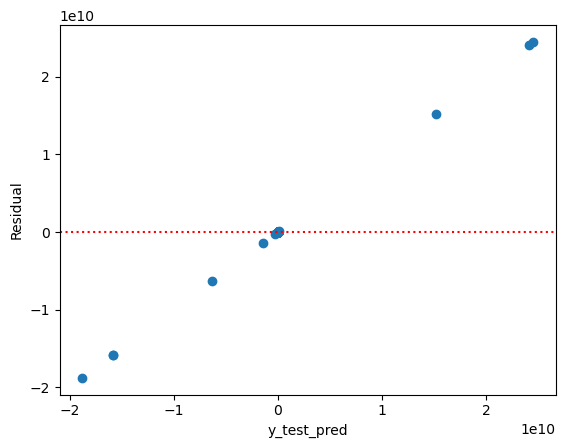

In [44]:
# Residual v/s predictions plot
res = y_test_pred-y_test
plt.scatter((y_test_pred - y_test) , res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("y_test_pred")
plt.ylabel("Residual")
plt.show()

# Inference
- Error terms on test set is very poor, hence we cannot use Linear Regression.
- Error terms are not homoscedastic

## Ridge Regression

In [48]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 1.0, 2.0, 3.0,  4.0, 5.0, 6.0]}

ridge=Ridge()
folds=5
model_cv=GridSearchCV(estimator=ridge,
                     param_grid=params,
                     scoring='r2',
                      cv=folds,
                      return_train_score=True,
                      verbose=1
                     )
model_cv.fit(X_train,y_train)

Fitting 5 folds for each of 11 candidates, totalling 55 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0]},
             return_train_score=True, scoring='r2', verbose=1)

In [49]:
print(model_cv.best_params_)

{'alpha': 5.0}


In [50]:
# creating dataframe with model_ridge results
ridge_results = pd.DataFrame(model_cv.cv_results_)
ridge_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.013554,0.002715,0.004437,0.001716,0.0001,{'alpha': 0.0001},0.692615,0.877548,0.909807,0.814920,...,0.837020,0.078881,11,0.957000,0.950286,0.953269,0.953935,0.954689,0.953836,0.002176
1,0.014575,0.001597,0.006086,0.001307,0.001,{'alpha': 0.001},0.692886,0.877703,0.906353,0.816803,...,0.839085,0.079756,10,0.957000,0.950285,0.952808,0.953934,0.953830,0.953572,0.002160
2,0.012783,0.001964,0.004224,0.002222,0.01,{'alpha': 0.01},0.695340,0.879199,0.905595,0.832241,...,0.842461,0.077958,9,0.956993,0.950266,0.952353,0.953882,0.953028,0.953304,0.002198
3,0.008958,0.003309,0.007162,0.002240,0.05,{'alpha': 0.05},0.702974,0.884603,0.907906,0.863878,...,0.852413,0.076300,8,0.956884,0.949945,0.951841,0.953266,0.952496,0.952886,0.002281
4,0.013868,0.002477,0.002813,0.002305,0.1,{'alpha': 0.1},0.709030,0.889468,0.908746,0.876512,...,0.857546,0.075117,7,0.956677,0.949273,0.951049,0.952345,0.951725,0.952214,0.002457


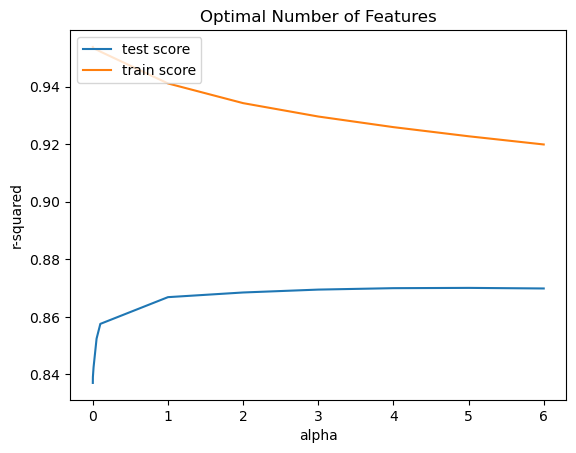

In [48]:
# plotting cv results

plt.plot(ridge_results["param_alpha"], ridge_results["mean_test_score"])
plt.plot(ridge_results["param_alpha"], ridge_results["mean_train_score"])
plt.xlabel('alpha')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')
plt.show()

##### Analysis of the above graph
***Train Score***

1. As the alpha (lambda) increases, the r2 score decreases which implies bias increases because model becomes simpler.


***Test Score***

1. At Lower values of alpha error is high because r2 is very low however the error for the train set is low implies overfitting. 
2. With the increasing value of alpha, the error starts to decrease reaches a peak at alpha=5. Here, the error is least and accuracy (r2 score) is the highest.
3. After alpha=5, the r2 score starts to plateau. Moreover the gap between train and test r2 is minimum indicating minimum variance at alpha=5.

In [51]:
alpha=5
ridge=Ridge(alpha=alpha)
ridge.fit(X_train,y_train)
print(ridge.coef_)

[ 2.25205151e-02  2.77428419e-02  2.53695114e-02  4.94502367e-02
  9.32136057e-03  2.08694688e-02  5.33214404e-02  6.00733603e-02
  5.17182895e-02 -7.43676183e-03  6.38445047e-02  2.28483518e-02
 -4.04373176e-03  3.16348270e-02  1.96459207e-02 -3.30364054e-04
 -2.03213339e-02  3.90259173e-02  3.28975322e-02  3.32308054e-02
  2.28600242e-02  1.95272356e-02 -3.82265884e-04  3.31168464e-03
  2.08985696e-02  5.13057838e-03  2.94115617e-02  9.09486043e-04
 -1.78692787e-02 -1.39548261e-02  5.53664116e-03  4.27315697e-03
  4.68772575e-03  9.96451144e-03  7.30623814e-03  3.64319860e-03
 -3.03625179e-03 -8.39639049e-03 -8.88086488e-03 -1.18620395e-02
 -8.45306333e-03 -6.75687746e-03 -6.33419100e-03  1.39158276e-02
  4.77811385e-03  9.69097663e-03  4.24408676e-03  1.03535107e-02
  7.70064695e-04  1.01816919e-02  8.98580006e-03  1.68436594e-02
 -1.44659734e-03  8.81659914e-03 -2.29413802e-03  8.02329567e-03
 -6.04560771e-03  1.35337003e-02 -9.22635421e-03 -1.14536394e-02
 -3.10953036e-03  5.47812

In [52]:
y_pred_train=ridge.predict(X_train)
y_pred_test=ridge.predict(X_test)
metric2 = []
r2_train_lr=r2_score(y_train,y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)
r2_test_lr=r2_score(y_test,y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)
rss_train_lr=np.sum(np.square(y_train-y_pred_train))
print(rss_train_lr)
metric2.append(rss_train_lr)
rss_test_lr=np.sum(np.square(y_test-y_pred_test))
print(rss_test_lr)
metric2.append(rss_test_lr)
mse_train_lr=mean_squared_error(y_train,y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr)
mse_test_lr=mean_squared_error(y_test,y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr)
rmse_train_lr=np.sqrt(mse_train_lr)
print(rmse_train_lr)
metric2.append(rmse_train_lr)
rmse_test_lr=np.sqrt(mse_test_lr)
print(rmse_train_lr)
metric2.append(rmse_test_lr)

0.920209300902235
0.7946970685334458
0.9723821714612804
1.2113266384065886
0.0009570690663988979
0.00277827210643713
0.0309365328761789
0.0309365328761789


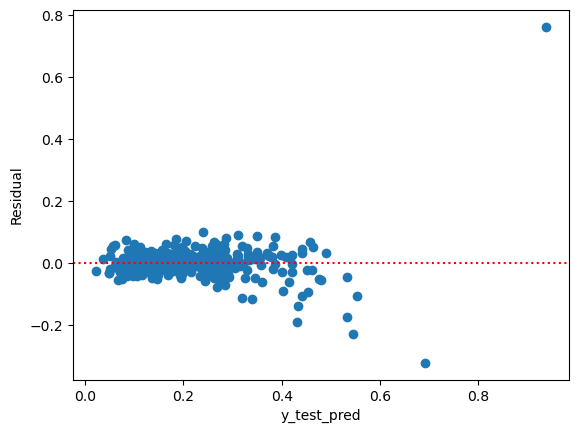

In [51]:
# Residual v/s predictions plot
res = y_pred_test-y_test
plt.scatter( y_pred_test , res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("y_test_pred")
plt.ylabel("Residual")
plt.show()

# Conclusion
- Error terms on test set acceptable at 0.79, hence we can use Ridge Regression.
- Error terms are homoscedastic

## Lasso Regression

In [53]:
params = {'alpha': [0.000001,0.00001,0.0001,0.001]}
lasso=Lasso()

model_cv=GridSearchCV(estimator=lasso,
                     param_grid=params,
                     scoring='r2',
                      cv=folds,
                      return_train_score=True,
                      verbose=1
                     )
model_cv.fit(X_train,y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-06, 1e-05, 0.0001, 0.001]},
             return_train_score=True, scoring='r2', verbose=1)

In [54]:
model_cv.best_params_

{'alpha': 0.0001}

In [55]:
lasso_results=pd.DataFrame(model_cv.cv_results_)
lasso_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.150270,0.021075,0.008383,0.006278,0.000001,{'alpha': 1e-06},0.698746,0.883718,0.906665,0.824387,...,0.843150,0.077943,3,0.956968,0.950264,0.952503,0.953906,0.953351,0.953398,0.002174
1,0.100926,0.027458,0.005335,0.005374,0.00001,{'alpha': 1e-05},0.710643,0.885813,0.912766,0.874343,...,0.859026,0.075655,2,0.955867,0.949117,0.951094,0.952777,0.951605,0.952092,0.002227
2,0.101536,0.008778,0.003802,0.002042,0.0001,{'alpha': 0.0001},0.735731,0.926650,0.921788,0.898384,...,0.879037,0.072297,1,0.943185,0.932572,0.935761,0.939190,0.935808,0.937303,0.003610
3,0.010854,0.005742,0.003942,0.005952,0.001,{'alpha': 0.001},0.740195,0.886959,0.885230,0.847607,...,0.836346,0.053919,4,0.886669,0.844640,0.847083,0.853637,0.847012,0.855808,0.015718


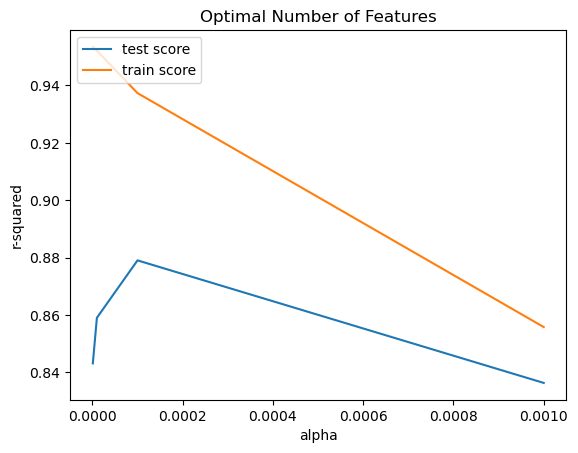

In [56]:
plt.plot(lasso_results['param_alpha'],lasso_results['mean_test_score'])
plt.plot(lasso_results['param_alpha'],lasso_results['mean_train_score'])
plt.xlabel('alpha')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')
plt.show()

#### Analysis of the above graph
From the above graph we can see that accuracy of the train and test set is the highest when alpha ≈ 0. Coincidentally they both are almost same.

***Train Score***

1. As the alpha (lambda) increases, the r2 score decreases means the error increases because the model becomes less overfitting and more generalised. At 0.0001 (close to 0) the train set accuracy is highest(more than 90%).

***Test Score***

1. At alpha = 0.0001 the test accuracy is highest (more than 80%).
2. After alpha=0.0001, the r2 score started decreasing hence, the model accuracy started dipping.
3. As alpha increases the variance between train and test becomes lower but as we do not want to compromise accuracy we settle for alpha = 0.0001.
 

In [57]:
lasso=Lasso(alpha=0.0001)
lasso.fit(X_train,y_train)

Lasso(alpha=0.0001)

In [58]:
lasso.coef_

array([ 2.66228436e-02,  6.72636529e-02,  1.69044435e-02,  4.50150302e-02,
        2.76731903e-03, -0.00000000e+00,  1.07643980e-01,  3.19908253e-02,
        3.92679429e-02, -1.29226524e-02,  2.29101673e-01,  1.53778950e-02,
       -0.00000000e+00,  1.02680621e-02,  9.53478754e-03, -0.00000000e+00,
       -4.53090510e-02,  0.00000000e+00,  2.00757291e-02,  3.71326246e-02,
        0.00000000e+00,  9.85142560e-03,  0.00000000e+00,  0.00000000e+00,
        1.11791525e-02,  1.35200453e-03,  0.00000000e+00,  0.00000000e+00,
       -5.01473642e-02, -4.49275524e-03,  0.00000000e+00,  1.27043869e-03,
        5.43463494e-04,  5.48552325e-03,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -1.22359186e-02, -4.29423705e-03,
       -4.87944796e-03, -0.00000000e+00, -5.95182962e-03,  1.06221673e-02,
        0.00000000e+00,  6.71353363e-03, -0.00000000e+00,  1.53761089e-03,
        0.00000000e+00,  1.16947353e-03,  3.65065284e-03,  2.01741552e-03,
       -1.08113505e-03,  

In [59]:
y_pred_train=lasso.predict(X_train)
y_pred_test=lasso.predict(X_test)
metric3 = []
r2_train_lr=r2_score(y_train,y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)
r2_test_lr=r2_score(y_test,y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)
rss_train_lr=np.sum(np.square(y_train-y_pred_train))
print(rss_train_lr)
metric3.append(rss_train_lr)
rss_test_lr=np.sum(np.square(y_test-y_pred_test))
print(rss_test_lr)
metric3.append(rss_test_lr)
mse_train_lr=mean_squared_error(y_train,y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr)
mse_test_lr=mean_squared_error(y_test,y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr)
rmse_train_lr=np.sqrt(mse_train_lr)
print(rmse_train_lr)
metric3.append(rmse_train_lr)
rmse_test_lr=np.sqrt(mse_test_lr)
print(rmse_train_lr)
metric3.append(rmse_test_lr)

0.9334397025222229
0.7416488154964198
0.8111477568989314
1.524321497104703
0.0007983737764753261
0.0034961502227172088
0.028255508781038188
0.028255508781038188


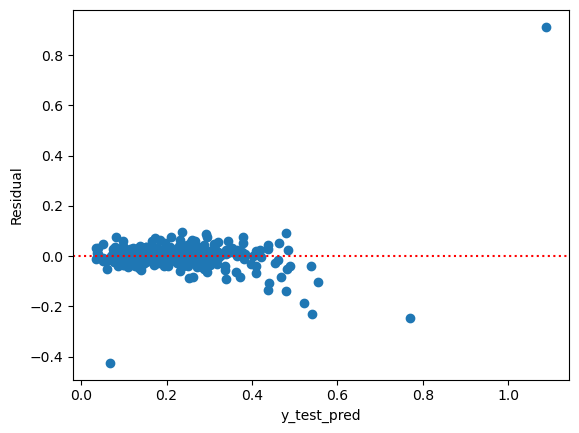

In [60]:
# Residual v/s predictions plot
res = y_pred_test-y_test
plt.scatter( y_pred_test , res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("y_test_pred")
plt.ylabel("Residual")
plt.show()

# Observation
- Error terms on test set acceptable at 0.74, hence we can use Lasso Regression.
- Error terms are not homoscedastic
- Since lot of coefficients are 0 the model would be simpler but the error terms favour Ridge Regression.

In [91]:
betas = pd.DataFrame(index=X_train.columns)
betas.rows = X_train.columns
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_
pd.set_option('display.max_rows', None)
betas.sort_values(by=['Ridge'], ascending=False).head(10)

,Ridge,Lasso
GrLivArea,0.053925,0.268405
1stFlrSF,0.052580,0.000000
OverallQual_10,0.052213,0.129434
TotalBsmtSF,0.047331,0.108239
OverallQual_9,0.044682,0.085077
Neighborhood_NoRidge,0.044396,0.045434
BsmtFinSF1,0.043614,0.042436
2ndFlrSF,0.040994,0.009015
TotRmsAbvGrd,0.036375,0.000000
FullBath,0.031720,0.007813


In [81]:
betas.sort_values(by=['Lasso'], ascending=False).head(10)

,Ridge,Lasso
GrLivArea,0.063845,0.229102
OverallQual_10,0.064149,0.133453
TotalBsmtSF,0.053321,0.107644
OverallQual_9,0.048954,0.080098
LotArea,0.027743,0.067264
BsmtFinSF1,0.049450,0.045015
Neighborhood_NoRidge,0.048080,0.043421
2ndFlrSF,0.051718,0.039268
Neighborhood_Crawfor,0.030488,0.038707
GarageCars,0.033231,0.037133


In [82]:
lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)','RMSE (Train)','RMSE (Test)']
        }
lr_metric = pd.DataFrame(lr_table ,columns = ['Metric'] )
rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')
final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.920209,0.933440
1,R2 Score (Test),0.794697,0.741649
2,RSS (Train),0.972382,0.811148
3,RSS (Test),1.211327,1.524321
4,MSE (Train),0.000957,0.000798
5,MSE (Test),0.002778,0.003496
6,RMSE (Train),0.030937,0.028256
7,RMSE (Test),0.052709,0.059128


# Subjective Questions

### Question 2:
- What will be the changes in the model if you choose double the value of alpha for both ridge and lasso?
- What will be the most important predictor variables after the change is implemented?

In [95]:
alpha=10
ridge=Ridge(alpha=alpha)
ridge.fit(X_train,y_train)
y_pred_train=ridge.predict(X_train)
y_pred_test=ridge.predict(X_test)
r2_train_lr=r2_score(y_train,y_pred_train)
print("r2_train:",r2_train_lr)
r2_test_lr=r2_score(y_test,y_pred_test)
print("r2_test:",r2_test_lr)
print("rss_train:",np.sum(np.square(y_train-y_pred_train)))
print("rss_test:",np.sum(np.square(y_test-y_pred_test)))
print("mse_train:",mean_squared_error(y_train,y_pred_train))
print("mse_test:",mean_squared_error(y_test,y_pred_test))

r2_train: 0.9095693728112965
r2_test: 0.8044150578285192
rss_train: 1.102047364250002
rss_test: 1.1539886392811831
mse_train: 0.0010846922876476396
mse_test: 0.002646762934131154


In [99]:
alpha=0.0002
lasso=Lasso(alpha=alpha)
lasso.fit(X_train,y_train)
y_pred_train=lasso.predict(X_train)
y_pred_test=lasso.predict(X_test)
r2_train_lr=r2_score(y_train,y_pred_train)
print("r2_train:",r2_train_lr)
r2_test_lr=r2_score(y_test,y_pred_test)
print("r2_test:",r2_test_lr)
print("rss_train:",np.sum(np.square(y_train-y_pred_train)))
print("rss_test:",np.sum(np.square(y_test-y_pred_test)))
print("mse_train:",mean_squared_error(y_train,y_pred_train))
print("mse_test:",mean_squared_error(y_test,y_pred_test))

r2_train: 0.921452083154628
r2_test: 0.771715259947595
rss_train: 0.95723680591241
rss_test: 1.346923713129009
mse_train: 0.0009421622105437106
mse_test: 0.0030892745713968096


In [85]:
doubling=pd.DataFrame(index=X_train.columns)
doubling.rows=X_train.columns
doubling['Ridge']=ridge.coef_
doubling['Lasso']=lasso.coef_
doubling.sort_values(by=['Ridge'], ascending=False).head(10)

,Ridge,Lasso
GrLivArea,0.053925,0.268405
1stFlrSF,0.052580,0.000000
OverallQual_10,0.052213,0.129434
TotalBsmtSF,0.047331,0.108239
OverallQual_9,0.044682,0.085077
Neighborhood_NoRidge,0.044396,0.045434
BsmtFinSF1,0.043614,0.042436
2ndFlrSF,0.040994,0.009015
TotRmsAbvGrd,0.036375,0.000000
FullBath,0.031720,0.007813


In [93]:
doubling.sort_values(by=['Lasso'], ascending=False)

,Ridge,Lasso
GrLivArea,0.053925,0.268405
OverallQual_10,0.052213,0.129434
TotalBsmtSF,0.047331,0.108239
OverallQual_9,0.044682,0.085077
Neighborhood_NoRidge,0.044396,0.045434
BsmtFinSF1,0.043614,0.042436
GarageCars,0.031497,0.039535
Neighborhood_Crawfor,0.026798,0.034456
LotArea,0.018871,0.033786
SaleType_New,0.015321,0.031389


### Question 3:
- Build a new model without 5 most import predictor variables and mention the top 5 as per new one.

In [106]:
category_cols=list(housing.select_dtypes(include=['object']).columns)


In [103]:
housing_new=housing.drop(['GrLivArea','OverallQual','TotalBsmtSF','Neighborhood'],axis=1)

In [112]:
category_cols=list(housing_new.select_dtypes(include=['object']).columns)
status=pd.get_dummies(housing_new[category_cols],drop_first=True,dtype=int)
df_new=pd.concat([housing_new,status],axis=1)
df_new.drop(category_cols,axis=1,inplace=True)
df_new_train,df_new_test=train_test_split(df,train_size=.7,random_state=100)


In [113]:
scaler=MinMaxScaler()
num_vars = list(df_new_train.select_dtypes(include=['int64', 'float64']).columns)
df_new_train[num_vars] = scaler.fit_transform(df_new_train[num_vars])
y_train_new=df_new_train.pop('SalePrice')
X_train_new=df_new_train

df_new_test[num_vars] = scaler.transform(df_new_test[num_vars])
y_test_new=df_new_test.pop('SalePrice')
X_test_new=df_new_test


In [114]:
lasso=Lasso(alpha=0.0001)
lasso.fit(X_train_new,y_train_new)

Lasso(alpha=0.0001)

In [116]:
lasso.coef_

array([ 3.76324375e-02,  4.56113756e-02,  5.07287255e-02,  1.49897079e-01,
        5.29194095e-02,  8.95043586e-02,  2.30599265e-01,  1.94285200e-01,
       -0.00000000e+00,  4.77632035e-03, -1.22744644e-02,  6.45021626e-03,
        7.23488731e-03, -2.20935279e-02, -7.47132897e-02,  0.00000000e+00,
        1.43771115e-02,  4.54581663e-02,  3.09645023e-03,  1.65131625e-02,
        3.74999846e-03,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -4.31740238e-02,  0.00000000e+00,
        0.00000000e+00,  1.42435989e-02,  3.24848477e-03,  4.12383351e-03,
        6.17539196e-03, -0.00000000e+00, -0.00000000e+00, -3.45506901e-03,
       -1.40544279e-02, -0.00000000e+00, -3.61412844e-03, -0.00000000e+00,
       -5.41630751e-03,  2.27408894e-02,  9.40576313e-06,  1.12893972e-02,
       -0.00000000e+00,  6.88153234e-03,  2.13442412e-03,  0.00000000e+00,
        1.86432624e-03,  0.00000000e+00, -1.78554440e-03,  1.36723755e-02,
       -4.23752682e-03,  

In [117]:
new_metrics=pd.DataFrame(index=X_train_new.columns)
new_metrics.rows=X_train.columns
new_metrics['Lasso']=lasso.coef_
new_metrics.sort_values(by=['Lasso'], ascending=False).head(10)

,Lasso
1stFlrSF,0.230599
2ndFlrSF,0.194285
BsmtFinSF1,0.149897
BsmtUnfSF,0.089504
BsmtFinSF2,0.052919
MasVnrArea,0.050729
LotArea,0.045611
GarageCars,0.045458
LotFrontage,0.037632
OverallCond_9,0.037017
